# Learning to Search Feasible and Infeasible Regions of Routing Problems with Flexible Neural k-Opt

Thank you for your interest in our work!

In this notebook, I will provide some demos on how to run and play with our NeuOpt framework.
Hope this helps with your project :)

For any queries and potential collaboration, please email me at: yiningma@u.nus.edu
The code is free to use for personal and academic usage. For other purposes, please contact me.

The code is based on the following paper:

Yining Ma, Zhiguang Cao, and Yeow Meng Chee, “Learning to Search Feasible and Infeasible Regions of Routing Problems with Flexible Neural k-Opt”, in Advances in Neural Information Processing Systems, vol. 36, 2023.

In [2]:
import os
import json
import torch
import pprint
import numpy as np
import random
from tensorboard_logger import Logger as TbLogger
import warnings

from problems.problem_tsp import TSP
from problems.problem_cvrp import CVRP
from agent.ppo import PPO
from tqdm.notebook import tqdm

## A. NeuOpt-GIRE Examples on CVRP-50
### 1. Initialize the hyper-parameters

In our code, we use the file 'options.py' and the variable 'opts' to store all hyper-parameters.

In [3]:
from options import get_options
opts = get_options('')
opts

Namespace(problem='tsp', graph_size=20, dummy_rate=0.5, eval_only=False, init_val_met='random', no_cuda=False, no_tb=False, no_saving=False, no_DDP=False, use_assert=False, seed=6666, val_m=1, stall_limit=10, k=4, wo_regular=True, wo_bonus=True, wo_RNN=False, wo_feature1=True, wo_feature3=True, wo_MDP=True, load_path=None, resume=None, epoch_start=0, K_epochs=3, eps_clip=0.1, T_train=200, n_step=4, batch_size=512, epoch_end=200, epoch_size=10240, val_size=1000, val_batch_size=1000, val_dataset=None, lr_model=8e-05, lr_critic=2e-05, lr_decay=0.985, warm_up=2, max_grad_norm=0.05, v_range=6.0, critic_head_num=4, actor_head_num=4, embedding_dim=128, hidden_dim=128, n_encode_layers=3, normalization='layer', gamma=0.999, T_max=1000, no_progress_bar=False, log_dir='logs', log_step=50, record=False, output_dir='outputs', run_name='run_name_20231027T181404', checkpoint_epochs=1, wo_feature2=True, world_size=0, distributed=False, use_cuda=False, save_dir='outputs/tsp_20/run_name_20231027T181404'

### 2. Set the hyper-parameters
We now try to test the pre-trained NeuOpt model with K=4 on 10 TSP-20 instances. The initial solutions are randomly initialized and we turn off the tensorboard logging and model saving functions.

In [4]:
opts.problem = 'cvrp' 
opts.dummy_rate = 0.4
opts.wo_feature1 = False
opts.wo_feature3 = False
opts.wo_regular = False
opts.wo_bonus = False
opts.wo_RNN = False
opts.wo_MDP = True
opts.graph_size = 50
opts.val_dataset='./datasets/cvrp_50.pkl'
opts.init_val_met = 'random'
opts.no_saving = True
opts.no_tb = True
opts.val_size = 10
opts.load_path = './pre-trained/cvrp50.pt'
opts.device = torch.device("cuda" if opts.use_cuda else "cpu")
opts.no_progress_bar = True
opts

Namespace(problem='cvrp', graph_size=50, dummy_rate=0.4, eval_only=False, init_val_met='random', no_cuda=False, no_tb=True, no_saving=True, no_DDP=False, use_assert=False, seed=6666, val_m=1, stall_limit=10, k=4, wo_regular=False, wo_bonus=False, wo_RNN=False, wo_feature1=False, wo_feature3=False, wo_MDP=True, load_path='./pre-trained/cvrp50.pt', resume=None, epoch_start=0, K_epochs=3, eps_clip=0.1, T_train=200, n_step=4, batch_size=512, epoch_end=200, epoch_size=10240, val_size=10, val_batch_size=1000, val_dataset='./datasets/cvrp_50.pkl', lr_model=8e-05, lr_critic=2e-05, lr_decay=0.985, warm_up=2, max_grad_norm=0.05, v_range=6.0, critic_head_num=4, actor_head_num=4, embedding_dim=128, hidden_dim=128, n_encode_layers=3, normalization='layer', gamma=0.999, T_max=1000, no_progress_bar=True, log_dir='logs', log_step=50, record=False, output_dir='outputs', run_name='run_name_20231027T181404', checkpoint_epochs=1, wo_feature2=True, world_size=0, distributed=False, use_cuda=False, save_dir=

### 3. Load the NeuOpt-GIRE agent and the CVRP env

In [5]:
def load_problem(name):
    problem = {
        'tsp': TSP,
        'cvrp': CVRP,
    }.get(name, None)
    assert problem is not None, "Currently unsupported problem: {}!".format(name)
    return problem

# Disable Tensorboard logging
tb_logger = None

# Figure out what's the problem
problem = load_problem(opts.problem)(
                        p_size = opts.graph_size,
                        init_val_met = opts.init_val_met,
                        with_assert = opts.use_assert,
                        DUMMY_RATE = opts.dummy_rate,
                        k = opts.k,
                        with_bonus = not opts.wo_bonus,
                        with_regular = not opts.wo_regular)

# Figure out the RL algorithm
agent = PPO(problem, opts)

# Load data from load_path
assert opts.load_path is None or opts.resume is None, "Only one of load path and resume can be given"
load_path = opts.load_path if opts.load_path is not None else opts.resume
if load_path is not None:
    agent.load(load_path)

CVRP with 50 nodes and 20 dummy depots (total 70).
 Regulation: True Bonus: True Do assert: False.
 MAX 4-opt.

simpleMDP:  True
# params in Actor {'Total': 685140, 'Trainable': 685140}
# params in Critic {'Total': 191107, 'Trainable': 191107}
Distributed: False
 [*] Loading data from ./pre-trained/cvrp50.pt


### 4.  Initialize 10 instances and show the first one


In [7]:
from torch.utils.data import DataLoader
from problems.problem_cvrp import CVRPDataset
dataset = CVRPDataset(size = 50, num_samples = 10, DUMMY_RATE=0.4)
batch = next(iter(DataLoader(dataset, batch_size=10)))
coordinates_first = batch['coordinates'][0]
demand_first = batch['demand'][0]

10 instances initialized.


### 5. Get and plot randomly generated initial solutions

Please note that in our implementation, the solution is stored in a linked list format. Here, if rec[i] = j, it means the node i is connected to node j, i.e., edge i-j is in the solution. For example, if edge 0-1, edge 1-5, edge 2-10 are in the solution, so we have rec[0]=1, rec[1]=5 and rec[2]=10.



In [8]:
rec = problem.get_initial_solutions(batch)
print(rec[0])

tensor([20, 28, 35, 42, 49, 56, 68,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
        19,  0, 21, 22, 23, 24, 25, 26, 27,  1, 29, 30, 31, 32, 33, 34, 38, 36,
        37, 39,  2, 40, 41, 43, 44, 47, 45, 46, 48, 54, 55, 50, 51, 52, 53, 65,
         3, 62, 57, 58, 59, 60, 61, 63,  4, 64, 66,  5, 67,  6, 69,  7])


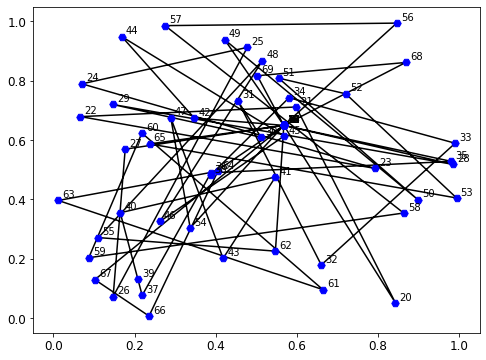

Linked list format (rec variable):
 tensor([20, 28, 35, 42, 49, 56, 68,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
        19,  0, 21, 22, 23, 24, 25, 26, 27,  1, 29, 30, 31, 32, 33, 34, 38, 36,
        37, 39,  2, 40, 41, 43, 44, 47, 45, 46, 48, 54, 55, 50, 51, 52, 53, 65,
         3, 62, 57, 58, 59, 60, 61, 63,  4, 64, 66,  5, 67,  6, 69,  7])

Here, the linked list format means:
edge 0-20 is in the solution
edge 1-28 is in the solution
edge 2-35 is in the solution
edge 3-42 is in the solution
edge 4-49 is in the solution
edge 5-56 is in the solution
edge 6-68 is in the solution
edge 7-8 is in the solution
edge 8-9 is in the solution
edge 9-10 is in the solution

Real solution after decoding (node visited in sequence):
 tensor([ 0, 20, 21, 22, 23, 24, 25, 26, 27,  1, 28, 29, 30, 31, 32, 33, 34, 38,
         2, 35, 36, 37, 39, 40, 41, 43, 47, 54,  3, 42, 44, 45, 46, 48, 55, 62,
         4, 49, 50, 51, 52, 53, 65,  5, 56, 57, 58, 59, 60, 61, 63, 64, 66, 67,
         6, 68, 69,  7,  8,

In [9]:
import torch
from matplotlib import pyplot as plt

def plot_tour(rec, coordinates, dpi = 300):
    real_seq = problem.get_order(rec.unsqueeze(0), return_solution = True)
    plt.figure(figsize=(8,6))
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.axis([-0.05, 1.05]*2)
    # plot the nodes
    plt.scatter(coordinates[:,0], coordinates[:,1], marker = 'H', s = 55, c = 'blue', zorder = 2)
    # plot the tour
    real_seq_coordinates = coordinates.gather(0,real_seq[0].unsqueeze(1).repeat(1,2))
    real_seq_coordinates = torch.cat((real_seq_coordinates, real_seq_coordinates[:1]),0)
    plt.plot(real_seq_coordinates[:,0], real_seq_coordinates[:,1], color = 'black', zorder = 1)
    # mark node
    for i,txt in enumerate(range(rec.size(0))):
        plt.annotate(txt,(coordinates[i,0]+0.01, coordinates[i,1]+0.01),)
    
    
    plt.show()

plot_tour(rec[0], coordinates_first)
print('Linked list format (rec variable):\n', rec[0])
print('\nHere, the linked list format means:')
for i in range(10):
    print(f'edge {i}-{rec[0,i]} is in the solution')

real_seq = problem.get_order(rec, return_solution = True)
print('\nReal solution after decoding (node visited in sequence):\n', real_seq[0])

### 6. Use pre-trained NeuOpt-GIRE to solve this mini-batch

The codes here are dapated from the 'agent.rollout' function defined in file 'agent/ppo.py'


In [10]:
from utils import torch_load_cpu, get_inner_model, move_to
from problems.problem_cvrp import total_history
feasibility_history_base = [True] * (total_history)
T=500
val_m = 1
stall_limit = 0
record = True
show_bar = False

bs, gs, _ = batch['coordinates'].size()
batch = move_to(batch, agent.opts.device)
batch_aug_same = problem.augment(batch, val_m, only_copy=True)
batch_aug = problem.augment(batch, val_m)
batch_feature = problem.input_feature_encoding(batch_aug)

solutions = move_to(problem.get_initial_solutions(batch_aug_same), agent.opts.device)
solution_best = solutions.clone()

obj, context = problem.get_costs(batch_aug_same, solutions, get_context = True, check_full_feasibility = True)
obj = torch.cat((obj[:,None], obj[:,None],obj[:,None]),-1).clone()
context2 = torch.zeros(bs*val_m,9).to(solutions.device);context2[:,-1] = 1
feasibility_history = torch.tensor(feasibility_history_base).view(-1,total_history).expand(bs*val_m, total_history).to(obj.device)

solution_history = [solutions.clone()]
solution_best_history = [solution_best.clone()]
obj_history = [obj.clone()]        
feasible_history_recorded = [feasibility_history[:,0]]
action = None
reward = []
stall_cnt_ins = torch.zeros(bs * val_m).to(solution_best.device)

for t in tqdm(range(T), disable = agent.opts.no_progress_bar or not show_bar, desc = 'rollout', bar_format='{l_bar}{bar:20}{r_bar}{bar:-20b}'):       

    action = agent.actor(problem,
                        batch_aug_same,
                        batch_feature,
                        solutions,
                        context,
                        context2,
                        action)[0]

    solutions, rewards, obj, feasibility_history, context, context2, info = problem.step(batch_aug_same, 
                                                                                        solutions,
                                                                                        action,
                                                                                        obj,
                                                                                        feasibility_history,
                                                                                        t,
                                                                                        weights = 0)
    index = rewards[:,0] > 0.0
    solution_best[index] = solutions[index].clone()

    # record informations
    reward.append(rewards[:,0].clone())
    obj_history.append(obj.clone())
    if record: 
        solution_history.append(solutions.clone())
        solution_best_history.append(solution_best.clone())
        feasible_history_recorded.append(feasibility_history[:,0].clone())

    # augment if stall>0 (checking every step)
    if stall_limit > 0:
        batch_aug_temp = problem.augment(batch, val_m)
        stall_cnt_ins = stall_cnt_ins * (1 - index.float()) + 1
        index_aug = stall_cnt_ins >= stall_limit
        batch_aug['coordinates'][index_aug] = batch_aug_temp['coordinates'][index_aug]
        batch_feature = problem.input_feature_encoding(batch_aug)
        stall_cnt_ins[index_aug] *= 0


# assert
best_length = problem.get_costs(batch_aug_same, solution_best, get_context = False, check_full_feasibility = True)
assert (best_length - obj[:,1] < 1e-5).all(), (best_length, obj, best_length - obj[:,1])
assert (problem.augment(batch, val_m, only_copy=True)['coordinates'] == batch_aug_same['coordinates']).all()
out = (obj[:,1].reshape(bs, val_m).min(1)[0], # batch_size, 1
       torch.stack(obj_history,1).view(bs, val_m, T+1, -1).min(1)[0], # batch_size, T, 2/3
       torch.stack(reward,1).view(bs, val_m, T).max(1)[0], # batch_size, T
       None if not record else (solution_history, solution_best_history, feasible_history_recorded)
      )

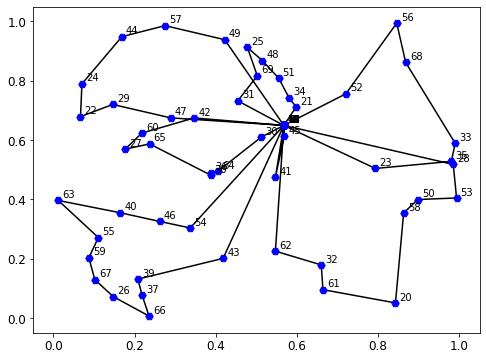

Linked list format (rec variable):
 tensor([21,  9, 62, 23, 41, 17, 14, 47, 13, 43, 11,  4, 15, 12,  8, 16, 18, 10,
        42,  1, 58, 34, 24, 35, 44, 69, 67, 65,  3, 22,  5,  6, 61, 68, 51, 33,
        64, 66, 36, 37, 46, 45, 60, 39, 57,  7, 54, 29, 25, 19, 53, 48,  0, 28,
         2, 63, 52, 49, 50, 55, 27, 20, 32, 40, 30, 38, 26, 59, 56, 31])

Here, the linked list format means:
edge 0-21 is in the solution
edge 1-9 is in the solution
edge 2-62 is in the solution
edge 3-23 is in the solution
edge 4-41 is in the solution
edge 5-17 is in the solution
edge 6-14 is in the solution
edge 7-47 is in the solution
edge 8-13 is in the solution
edge 9-43 is in the solution

Real solution after decoding (node visited in sequence):
 tensor([ 0, 21, 34, 51, 48, 25, 69, 31,  6, 14,  8, 13, 12, 15, 16, 18, 42, 60,
        27, 65, 38, 36, 64, 30,  5, 17, 10, 11,  4, 41, 45,  7, 47, 29, 22, 24,
        44, 57, 49, 19,  1,  9, 43, 39, 37, 66, 26, 67, 59, 55, 63, 40, 46, 54,
         2, 62, 32, 61, 20

In [11]:
coordinates_first = batch['coordinates'][0]
plot_tour(solution_best[0], coordinates_first)
print('Linked list format (rec variable):\n', solution_best[0])
print('\nHere, the linked list format means:')
for i in range(10):
    print(f'edge {i}-{solution_best[0,i]} is in the solution')

real_seq = problem.get_order(solution_best, return_solution = True)
print('\nReal solution after decoding (node visited in sequence):\n', real_seq[0])

## B. Visualize the GIRE exploration 

In [12]:
import gif

@gif.frame
def plot_tour(rec, rec_best, feasibility, coordinates, dpi = 100):
    real_seq = problem.get_order(rec.unsqueeze(0), return_solution = True)
    real_best = problem.get_order(rec_best.unsqueeze(0), return_solution = True)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))  # Create two side-by-side axes

    for ax in [ax1, ax2]:  # Plot on both axes
        if ax==ax1:
            ax.axis([-0.05, 1.05]*2)
            # plot the nodes
            ax.scatter(coordinates[:,0], coordinates[:,1], marker = 'H', s = 55, c = 'blue', zorder = 2)
            # plot the tour
            real_seq_coordinates = coordinates.gather(0,real_seq[0].unsqueeze(1).repeat(1,2))
            real_seq_coordinates = torch.cat((real_seq_coordinates, real_seq_coordinates[:1]),0)
            color = 'red' if not feasibility else 'green'
            ax.plot(real_seq_coordinates[:,0], real_seq_coordinates[:,1], color = color, zorder = 1)
#             # mark node
#             for i,txt in enumerate(range(rec.size(0))):
#                 ax.annotate(txt,(coordinates[i,0]+0.01, coordinates[i,1]+0.01),)
            ax.set_title('Current Solution')
        else:
            ax.axis([-0.05, 1.05]*2)
            # plot the nodes
            ax.scatter(coordinates[:,0], coordinates[:,1], marker = 'H', s = 55, c = 'blue', zorder = 2)
            # plot the tour
            real_best_coordinates = coordinates.gather(0,real_best[0].unsqueeze(1).repeat(1,2))
            real_best_coordinates = torch.cat((real_best_coordinates, real_best_coordinates[:1]),0)
            ax.plot(real_best_coordinates[:,0], real_best_coordinates[:,1], color = 'black', zorder = 1)
#             # mark node
#             for i,txt in enumerate(range(rec.size(0))):
#                 ax.annotate(txt,(coordinates[i,0]+0.01, coordinates[i,1]+0.01),)
            ax.set_title('Best Solution')
    plt.tight_layout()

We are now generating a GIF to visualize the progression of our search algorithm. This GIF will feature two side-by-side subfigures. On the left, we display the current solution. The solution will be color-coded: green signifies that the current solution is feasible, while red indicates it's not. On the right, we showcase the best solution we've discovered during the search up to that point. 

(It takes a while to generate..)

In [13]:
frames = []
for i in range(500):
    item = i
    solution = solution_history[item][0]
    solution_best = solution_best_history[item][0]
    feasibility = feasible_history_recorded[item][0]
    img = plot_tour(solution, solution_best, feasibility, coordinates_first, dpi=1)
    frames.append(img)

gif.save(frames, 'GIRE.gif', duration=100)

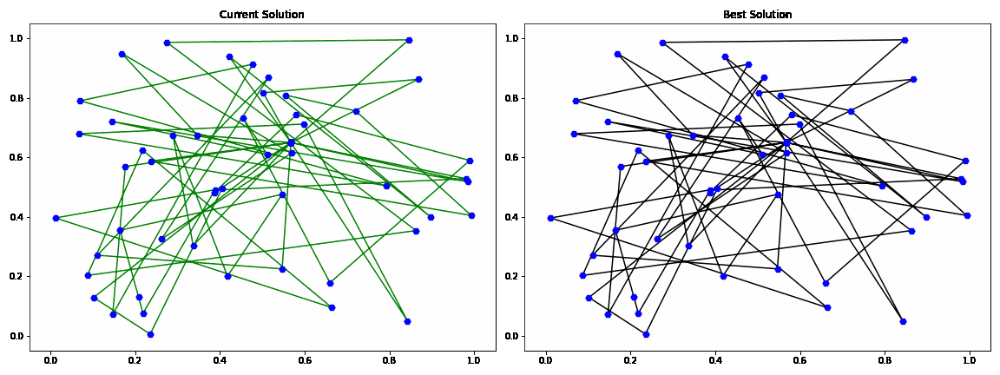

In [14]:
from IPython.display import display, Image
display(Image(filename="GIRE.gif"))